# Mohammad Sina Parvizi Motlagh - 810101394
Artificial Intelligence - CA1: **`Image Clustering`** - Spring 1403 \
Goal: In this project, the goal is to perform image clustering on a dataset containing images of flowers.

## Review of a Project
The dataset consists of 210 images, each labeled with a flower name (e.g., 0001.png to 0210.png) and their corresponding labels (0 to 9) indicating the category of the flower. The objective is to cluster these images based on their visual features using the following steps:
1. Preprocess the data to enhance model performance.
2. Utilize the VGG16 pre-trained model for feature extraction, removing the fully connected layers.
3. Apply dimensionality reduction using PCA to reduce the dimensionality of the feature space.
4. Train clustering models, including KMeans and DBSCAN, on the reduced feature space.
5. Evaluate the clustering models using silhouette and homogeneity scores.
6. Iterate on the process by fine-tuning parameters and potentially applying further preprocessing techniques to improve clustering performance.

## Imports
Before we get started, we need to import the modules needed in order to load/process the images along with the modules to extract and cluster our feature vectors.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import VGG16
from keras.models import Model
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from sklearn.preprocessing import Normalizer
from sklearn.metrics.cluster import homogeneity_score
from sklearn.metrics.cluster import silhouette_score

## Read File
Here, I will read the provided csv-file and then store flower names in a list called `flowers`.

In [2]:
main_direcotory = "./flower_images/"
df = pd.read_csv(f"{main_direcotory}flower_labels.csv")
df

,file,label
0,0001.png,0
1,0002.png,0
2,0003.png,2
3,0004.png,0
4,0005.png,0
...,...,...
205,0206.png,6
206,0207.png,0
207,0208.png,4
208,0209.png,6


In [3]:
flowers = [main_direcotory + flower for flower in df["file"]]
labels = df['label'].values
flowers

['./flower_images/0001.png',
 './flower_images/0002.png',
 './flower_images/0003.png',
 './flower_images/0004.png',
 './flower_images/0005.png',
 './flower_images/0006.png',
 './flower_images/0007.png',
 './flower_images/0008.png',
 './flower_images/0009.png',
 './flower_images/0010.png',
 './flower_images/0011.png',
 './flower_images/0012.png',
 './flower_images/0013.png',
 './flower_images/0014.png',
 './flower_images/0015.png',
 './flower_images/0016.png',
 './flower_images/0017.png',
 './flower_images/0018.png',
 './flower_images/0019.png',
 './flower_images/0020.png',
 './flower_images/0021.png',
 './flower_images/0022.png',
 './flower_images/0023.png',
 './flower_images/0024.png',
 './flower_images/0025.png',
 './flower_images/0026.png',
 './flower_images/0027.png',
 './flower_images/0028.png',
 './flower_images/0029.png',
 './flower_images/0030.png',
 './flower_images/0031.png',
 './flower_images/0032.png',
 './flower_images/0033.png',
 './flower_images/0034.png',
 './flower_ima

## Hyper-Parameters

- `K`: The number of clusters to form as well as the number of centroids to generate.
- `EPS`: The maximum distance between two samples for one to be considered as in the neighborhood of the other. This is not a maximum bound on the distances of points within a cluster.
- `MINPTS`:  The number of samples (or total weight) in a neighborhood for a point to be considered as a core point. This includes the point itself. If min_samples is set to a higher value, DBSCAN will find denser clusters, whereas if it is set to a lower value, the found clusters will be more sparse.
- `NUM_OF_ITERS`: Number of times the k-means algorithm is run with different centroid seeds. The final results is the best output of n_init consecutive runs in terms of inertia.
- `PCA_DIM`: Number of components to keep.

In [29]:
K = 10
EPS = .1
MINPTS = 1
NUM_OF_ITERS = 10
PCA_DIM = 2

## Preprocessing and Feature Extraction
**`What is VGG16?`** A convolutional neural network is also known as a ConvNet, which is a kind of artificial neural network. A convolutional neural network has an input layer, an output layer, and various hidden layers. VGG16 is a type of CNN (Convolutional Neural Network) that is considered to be one of the best computer vision models to date. The creators of this model evaluated the networks and increased the depth using an architecture with very small (3 × 3) convolution filters, which showed a significant improvement on the prior-art configurations. They pushed the depth to 16–19 weight layers making it approx — 138 trainable parameters.

**`What is VGG16 used for`?** VGG16 is object detection and classification algorithm which is able to classify 1000 images of 1000 different categories with 92.7% accuracy. It is one of the popular algorithms for image classification and is easy to use with transfer learning.

**`More about VGG16`:** The 16 in VGG16 refers to 16 layers that have weights. In VGG16 there are thirteen convolutional layers, five Max Pooling layers, and three Dense layers which sum up to 21 layers but it has only sixteen weight layers i.e., learnable parameters layer. \
VGG16 takes input tensor size as 224, 244 with 3 RGB channel. \
Most unique thing about VGG16 is that instead of having a large number of hyper-parameters they focused on having convolution layers of 3x3 filter with stride 1 and always used the same padding and maxpool layer of 2x2 filter of stride 2. \
The convolution and max pool layers are consistently arranged throughout the whole architecture. \
Conv-1 Layer has 64 number of filters, Conv-2 has 128 filters, Conv-3 has 256 filters, Conv 4 and Conv 5 has 512 filters. \
Three Fully-Connected (FC) layers follow a stack of convolutional layers: the first two have 4096 channels each, the third performs 1000-way ILSVRC classification and thus contains 1000 channels (one for each class). The final layer is the soft-max layer.


### Q1. What is the reason for feature extraction? Why don't we just read the pixels? Explain.
Feature extraction is performed to transform raw data (in this case, pixels of images) into a more meaningful and compact representation that captures important characteristics or patterns in the data. In the context of image processing and machine learning, using raw pixel values as features might not be the most effective approach because it can lead to high-dimensional data with redundant or irrelevant information. By extracting features, we aim to reduce dimensionality, remove noise, and focus on relevant information that can improve the performance of the model. In the case of using a pre-trained model like VGG16, feature extraction involves passing images through the network to obtain activations from one of the intermediate layers, which serve as meaningful representations of the input images.

### Q2. Research about feature extraction from photos and briefly explain about its 3 techniques.
- **`Histogram of Oriented Gradients (HOG)`**: HOG is a feature descriptor that extracts gradient information from an image by computing histograms of oriented gradients in localized regions of the image. HOG is often used in computer vision tasks such as object detection, face detection, pedestrian detection, text classification and OCR. While CNNs have shown superior performance in various image-related tasks, there may be situations where HOG could be a better choice for feature extraction. One such scenario is when the dataset is relatively small and training a deep learning model may not be feasible due to the lack of data or computational resources. In such cases, HOG can provide a simple and effective feature extraction approach that can be easily combined with a standard machine learning algorithm such as Support Vector Machines (SVM). Another scenario where HOG may be useful is when the images have a relatively low resolution or are highly pixelated. In such cases, the gradients may provide more robust features than the raw pixel values, making HOG a suitable choice for feature extraction.
- **`Local Binary Patterns (LBP)`**: Local Binary Patterns (LBP) is a widely used feature extraction method for analyzing texture information in images. LBP captures the local structure of an image by comparing the gray values of a pixel to its surrounding neighbors and encoding the result into a binary pattern. LBP features are often used where there is limited data and in machine learning algorithms for various computer vision tasks such as face recognition, texture analysis, and object recognition. LBP is computationally efficient and can operate in real-time applications, such as surveillance and tracking systems, where the processing speed is crucial.
- **`Convolutional Neural Networks(CNN)`**: CNNs are generally the preferred choice for feature extraction from images because CNNs are specifically designed for processing color images and perform more complex tasks such as image classification, object detection, or segmentation where it can extract complex and descriptive features with any variations such as lighting conditions, scale, and other factors in the image. It is useful in situations where you want to have high accuracy after processing your images, thus making it the most efficient way.
- **`Color-based features`**: Color-based features are a type of feature extraction technique that capture the color distribution and statistics of an image and also used for image retrieval. These features are often used in computer vision applications such as object recognition, image segmentation, and content-based image retrieval. It is computationally efficient than CNNs and used where there is limited data.

### Q3. What pre-processing should be done on the images so that they are ready to enter the model?
Before feeding images into the VGG16 model for feature extraction, several pre-processing steps are typically applied to ensure compatibility and improve performance:
First, we use `load_img()` function to load image. We can perform certain functions on the image like resizing it, changing its color, convert into an array, etc before training any model. To resize the shape of the image, `resize()` method is invoked on the image. The size in which we want to convert the image should be iterable. Here, will resize it to (224, 224). Because the VGG model expects the images it receives to be 224x224 NumPy arrays. Then we use `img_to_array()` method to convert images into array. Currently, our array has only 3 dimensions (rows, columns, channels) and the model operates in batches of samples. So we need to expand our array to add the dimension that will let the model know how many images we are giving it (num_of_samples, rows, columns, channels). We use `reshape()` function here. The last step is to pass the reshaped array to the `preprocess_input()` method and our image is ready to be loaded into the model. preproccess_input is meant to prepare your image into the format the model requires. At the end, we can pass our image through the predict method to get our feature vector.



In [5]:
model = VGG16(weights="imagenet", include_top=False)
model.summary()
output = model.output
model = Model(inputs=model.input, outputs=output)

# model = VGG16(weights="imagenet", include_top=False)
# model.summary()
# output = model.layers[-2].output
# model = Model(inputs=model.inputs, outputs=output)



Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0   

In [6]:
def extract_features(file):
    img = load_img(file)
    img = img.resize((224, 224))
    img = img_to_array(img=img)
    img = preprocess_input(img)
    reshaped_img = img.reshape(1, img.shape[0], img.shape[1], img.shape[2])
    return reshaped_img

In [7]:
features = []
for flower in flowers:
    img = extract_features(flower)
    img_features = model.predict(img, use_multiprocessing=True)
    img_features = img_features.flatten()
    features.append(img_features)
    
features = np.array(features)
features.shape

1/1 [==============================] - 0s 145ms/step


(210, 25088)

## Clustering Implementation
### Q4. Explain about the KMeans and DBSCAN methods and the advantages and disadvantages of these methods.
- **`KMeans`**: KMeans is a partitioning clustering algorithm that aims to partition data into K clusters by minimizing the within-cluster variance. It iteratively assigns each data point to the nearest cluster centroid and updates the centroids based on the mean of the data points assigned to each cluster. The main advantages of KMeans include its simplicity, scalability to large datasets, and efficiency. However, KMeans requires specifying the number of clusters (K) in advance, and its performance may be sensitive to the initial choice of centroids. It also assumes that clusters are spherical and of similar size, which may not always hold in real-world data.
- **`DBSCAN (Density-Based Spatial Clustering of Applications with Noise)`**: DBSCAN is a density-based clustering algorithm that groups together closely packed points based on density. It defines clusters as dense regions separated by regions of lower density. DBSCAN does not require specifying the number of clusters in advance and can automatically identify outliers as noise points. It is robust to noise and can handle clusters of arbitrary shapes. However, DBSCAN may struggle with datasets of varying densities and may produce varying results based on the choice of parameters such as epsilon (eps) and min_samples.

### Q5. What method have you used to find the most suitable K in the Means-K method? Explain.
One common method for determining the optimal number of clusters (K) in KMeans is the elbow method. The elbow method is a graphical method for finding the optimal K value in a k-means clustering algorithm. The elbow graph shows the within-cluster-sum-of-square (WCSS) values on the y-axis corresponding to the different values of K (on the x-axis). The optimal K value is the point at which the graph forms an elbow. Another method is the silhouette score, which measures how similar an object is to its own cluster compared to other clusters. The silhouette score can be computed for different values of K, and the value that maximizes the silhouette score is chosen.

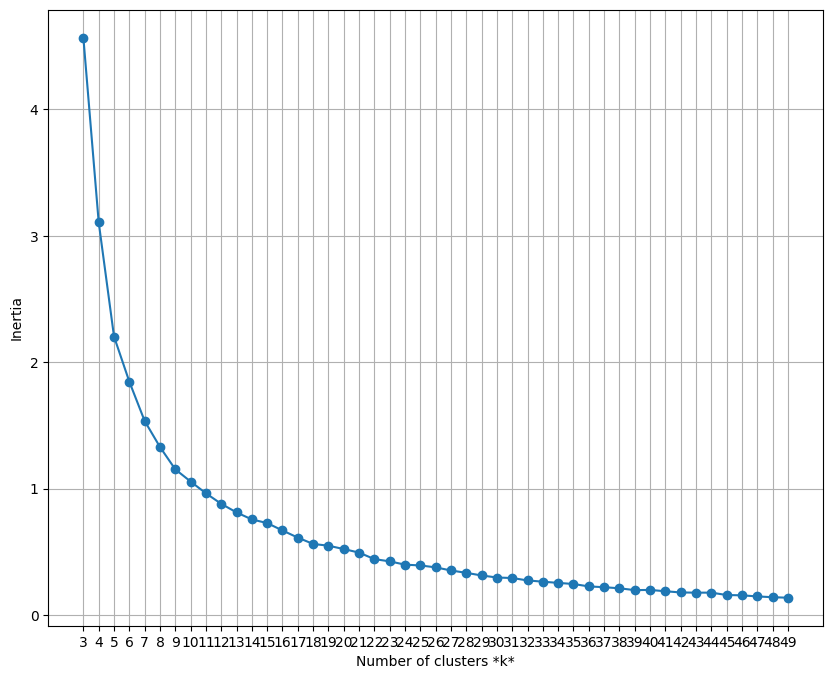

In [8]:
kmeans = KMeans(n_clusters=K, n_init=NUM_OF_ITERS)
scaler = Normalizer()
scaled_features = scaler.fit_transform(features)
pca = PCA(n_components=PCA_DIM)
features_with_pca = pca.fit_transform(scaled_features)


# Elbow Method
inertias = []
list_k = list(range(3, 50))

for k in list_k:
    kmeans = KMeans(n_clusters=k, n_init=10)
    kmeans.fit(features_with_pca)
    
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(10, 8))
plt.plot(list_k, inertias, marker='o')
plt.xticks(list_k)
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Inertia')
plt.grid(True)
plt.show()

In [9]:
kmeans = KMeans(n_clusters=K, n_init=NUM_OF_ITERS)
scaler = Normalizer()
scaled_features = scaler.fit_transform(features)
kmeans.fit(scaled_features)

KMeans(n_clusters=10, n_init=10)

In [10]:
print(f"silhoutte_score: {silhouette_score(scaled_features, kmeans.labels_)}")
print(f"homogeneity_score: {homogeneity_score(labels, kmeans.labels_)}")

silhoutte_score: 0.027064094319939613
homogeneity_score: 0.5447030367366793


## Dimension Reduction
In Machine Learning and Statistics,in order to build a good performing model we try to pass on those features in the dataset that are significant to one another. In other words,Dimensionality reduction is the process of reducing the number of random variables under consideration, by obtaining a set of principal variables.

### Q7. Research PCA and briefly explain how it works.
While you can speed up the fitting of a machine learning algorithm by changing the optimization algorithm, a more common way to speed up the algorithm is to use principal component analysis (PCA). If your learning algorithm is too slow because the input dimension is too high, then using PCA to speed it up can be a reasonable choice. This is probably the most common application of PCA. Another common application of PCA is for data visualization. \
Principal component analysis (PCA) is a method of reducing the dimensionality of data and is used to improve data visualization and speed up machine learning model training. \
PCA works by finding the orthogonal axes (principal components) along which the data varies the most. PCA identifies the directions (principal axes) that capture the maximum variance in the data and projects the data onto these axes. The first principal component explains the most variance, followed by the second principal component, and so on. PCA can be used for data visualization, noise reduction, and feature extraction. 

In [11]:
pca = PCA(n_components=PCA_DIM)
x = pca.fit_transform(scaled_features)

kmeans_with_pca = KMeans(n_clusters=K, n_init=NUM_OF_ITERS)
kmeans_with_pca.fit(x)

KMeans(n_clusters=10, n_init=10)

## Evaluation and Analysis
### Q8. Explain how to calculate silhouette and homogeneity criteria.
**`Silhouette score`**: The Silhouette score is a metric used to evaluate how good clustering results are in data clustering. This score is calculated by measuring each data point's similarity to the cluster it belongs to and how different it is from other clusters. The Silhouette score is commonly used to assess the performance of clustering algorithms like K-Means.
It ranges from -1 to +1:
- Positive values indicate that data points belong to the correct clusters, indicating good clustering results.
- A score of zero suggests overlapping clusters or data points equally close to multiple clusters.
- Negative values indicate that data points are assigned to incorrect clusters, indicating poor clustering results.
A higher Silhouette score indicates better clustering results.
Therefore, the Silhouette score is an important criterion used to evaluate the settings and outcomes of data clustering algorithms. A high Silhouette score indicates more consistent and better clustering results, while a low score may indicate that data points are assigned to incorrect clusters or that the clustering algorithm is not suitable for the data.

$$a(i) = \frac{1}{\lvert C_i \rvert - 1} \sum_{j \in C_i, i \neq j} d(i, j)$$

$$b(i) = \min_{k \neq C_i} \frac{1}{\lvert C_k \rvert} \sum_{j \in C_k} d(i, j)$$

$$s(i) = \frac{b(i) - a(i)}{\max\{a(i), b(i)\}}$$

C_i is the cluster to which point i belongs. \
∣Ci| is the number of points in cluster Ci. \
|Ck| ∣ is the number of points in the nearest cluster to point i. \
d(i,j) is the distance between points i and j in their respective clusters. \
a(i) is the average distance from point i i to other points in the same cluster. \
b(i) is the average distance from point i i to points in the nearest cluster other than its own. \
s(i) is the silhouette score for point i.

**`Homogeneity score`**: The homogeneity score measures the degree to which each cluster contains only data points that are members of a single class. It ranges from 0 to 1, where a score of 1 indicates perfect homogeneity. The homogeneity score is calculated based on the conditional entropy of the class labels given the cluster assignments. This metric is autonomous of the outright values of the labels. A permutation of the cluster label values won't change the score value in any way.

$$h = 1 - \frac{H(C|K)}{H(C)}$$

$$H(C,K) = -\sum_{k=1}^{K} \frac{n_{ck}}{N} \log \left(\frac{n_{ck}}{N}\right)$$

It is easy to understand why this is the case. If one looks at the term H(C|K) it contains n𝒸ₖ / nₖ which represents the ratio between the number of samples labelled c in cluster k and the total number of samples in cluster k. When all samples in cluster k have the same label c, the homogeneity equals 1. Note that there is a sum over c and k, it doesn’t matter which is the cluster that contains a particular label, it is sufficient that there is at least one. This is useful when running unsupervised methods whose output has nothing to do with the labels.

In [12]:
print(f"silhoutte_score after pca: {silhouette_score(x, kmeans_with_pca.labels_)}")
print(f"homogenity_score after pca: {homogeneity_score(labels, kmeans_with_pca.labels_)}")

silhoutte_score after pca: 0.4005894958972931
homogenity_score after pca: 0.4792911033776006


In [13]:
# Finding the best pca component and k based on homogeneity
res = []
cnt = 0

mx = 0
bst_cluster = 0
bst_pca = 0
for pca_com in range(2, 10):
    res.append([])
    for cluster in range(3, 20):
        pcaa = PCA(n_components=pca_com)
        xx = pcaa.fit_transform(features)

        kk = KMeans(n_clusters=cluster, n_init=10)
        kk.fit(xx)
        
        score = homogeneity_score(labels, kk.labels_)
        res[cnt].append(score)
        
        if(mx < score):
            mx = score
            bst_cluster = cluster
            bst_pca = pca_com
    cnt += 1
        
    print(mx, bst_cluster, bst_pca)

0.5211774423245976 18 2
0.5845521678213641 19 3
0.6341505756240252 18 4
0.6466859632033675 18 5
0.6466859632033675 18 5
0.6466859632033675 18 5
0.6466859632033675 18 5
0.6466859632033675 18 5


In [14]:
# Finding the best pca component and k based on silhouette score
res = []
cnt = 0

mx = 0
bst_cluster = 0
bst_pca = 0
for pca_com in range(2, 10):
    res.append([])
    for cluster in range(3, 20):
        pca = PCA(n_components=pca_com)
        xx = pca.fit_transform(features)

        kk = KMeans(n_clusters=cluster, n_init=10)
        kk.fit(xx)
        
        score = silhouette_score(x, kk.labels_)
        res[cnt].append(score)
        
        if(mx < score):
            mx = score
            bst_cluster = cluster
            bst_pca = pca_com
    cnt += 1
        
    print(mx, bst_cluster, bst_pca)

0.23219678 3 2
0.24456616 3 3
0.26289567 3 4
0.298947 3 5
0.298947 3 5
0.298947 3 5
0.298947 3 5
0.298947 3 5


In [15]:
def visualize(f, k_model):
    n_clusters = len(np.unique(k_model.labels_))
    plt.figure(figsize=(10, 8))
    for cluster_label in range(n_clusters):
        plt.scatter(f[k_model.labels_ == cluster_label, 0], f[k_model.labels_ == cluster_label, 1], label=f'Cluster {cluster_label}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.title('K-Means Clusters')
    plt.legend()
    plt.show()

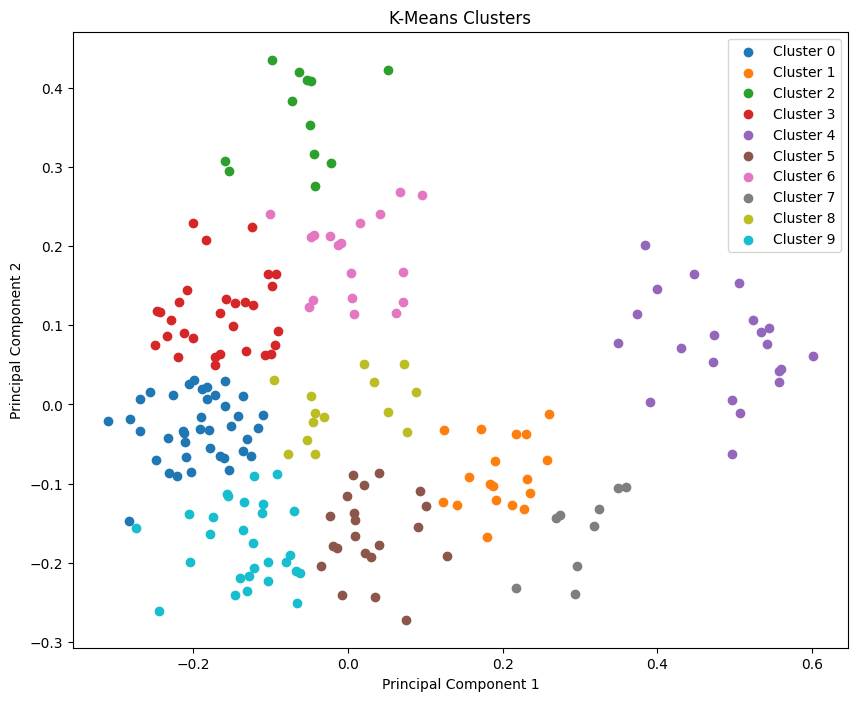

In [16]:
visualize(x, kmeans_with_pca)

In [17]:
filenames = np.array(list(flowers))

groups = {}
for file, cluster in zip(filenames,kmeans_with_pca.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [37]:
def view_cluster(cluster):
    plt.figure(figsize = (25,25))
    files = groups[cluster]
    for index, file in enumerate(files):
        plt.subplot(10, 10, index + 1)
        plt.title(f"cluster {cluster}")
        img = load_img(file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

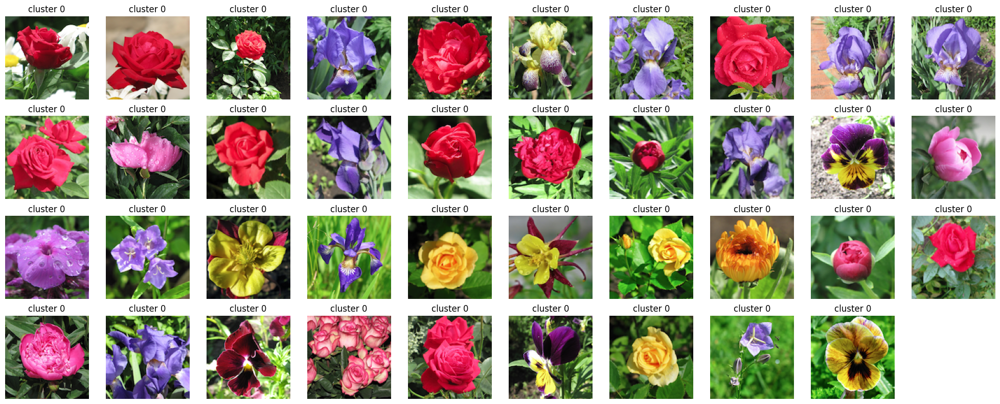

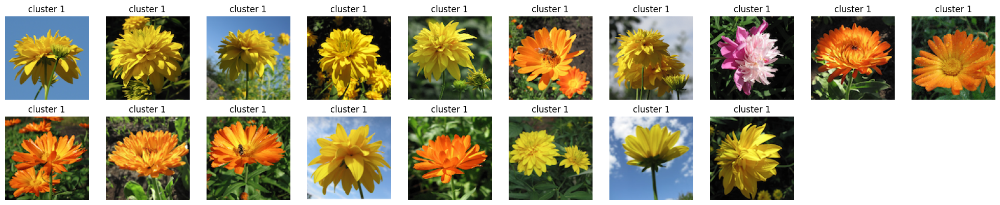

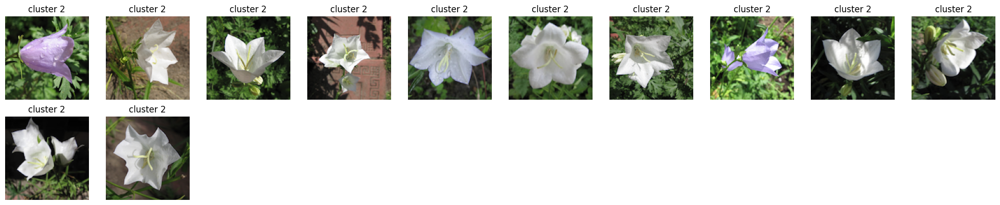

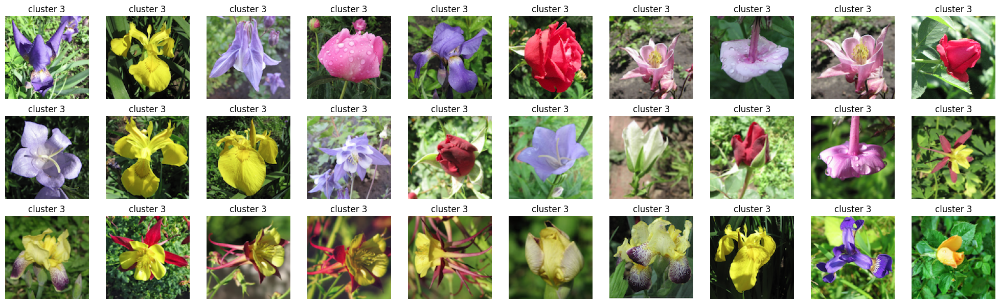

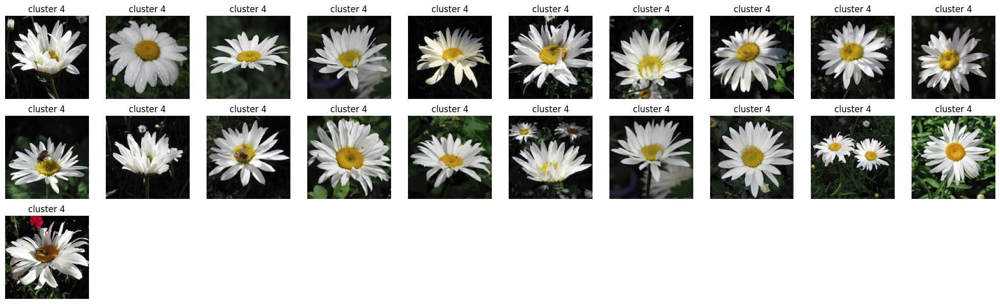

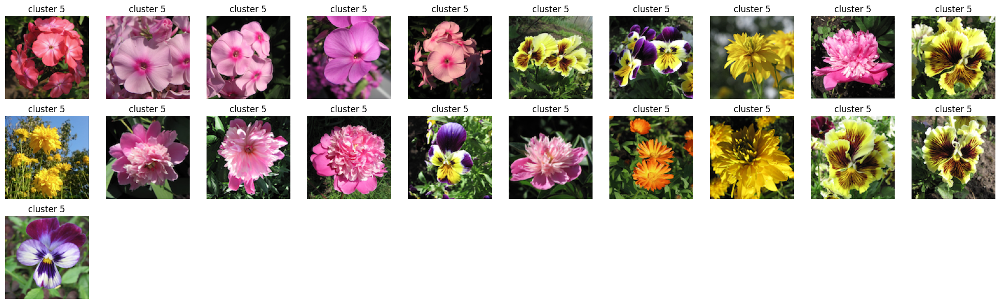

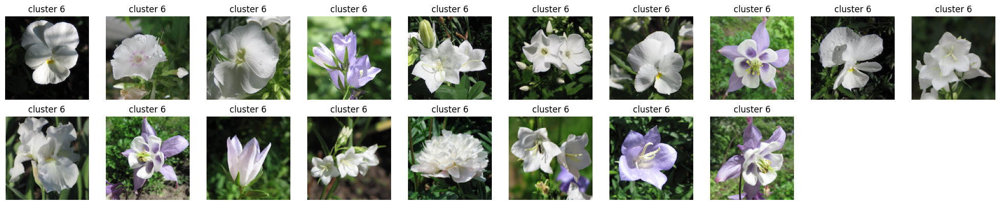

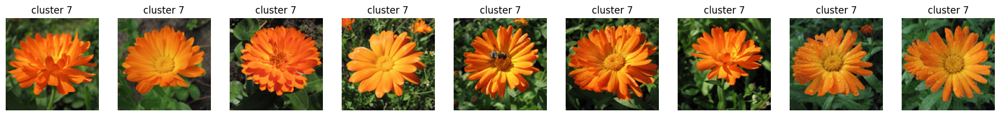

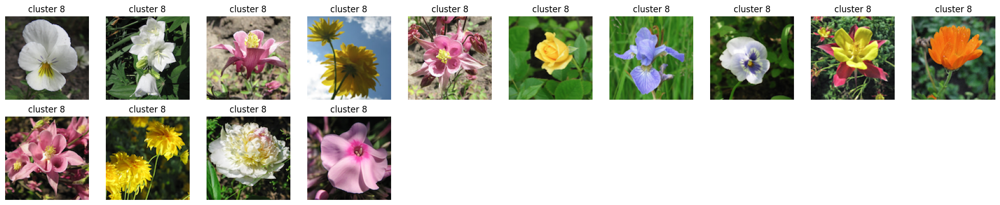

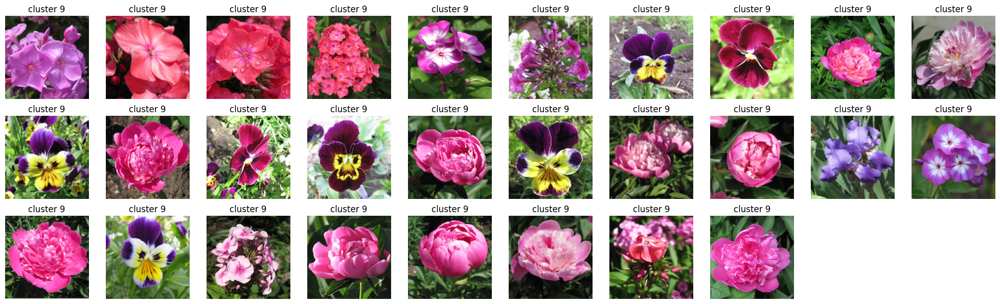

In [38]:
for i in range(K):
    view_cluster(i)

In [20]:
epss = np.arange(0.001,0.13,0.0005)

minPts_range=range(1, 20)

best_score = -1

best_eps = -1
best_minPts = -1

for eps in epss:
    for minPts in minPts_range:
        db = DBSCAN(eps=eps, min_samples=minPts)
        db.fit(x)
        
        if len(np.unique(db.labels_)) > 1 and len(np.unique(db.labels_)) < 210:
            
            score = silhouette_score(x, db.labels_)
            if score < 0:
                continue
            
            if score > best_score:
                best_score = score
                best_eps = eps
                best_minPts = minPts
                
                
print(best_eps, best_minPts, best_score)

0.1 1 0.5063592


In [21]:
minpts_range = range(1, 20)
epss_range = np.arange(0.001, 0.15, 0.0005)
res = []
for ms in minpts_range:
    for eps in epss_range:
        labelss = DBSCAN(min_samples=ms, eps=eps).fit_predict(x)
        if all(element == labelss[0] for element in labelss):
            continue
        if max(labelss) >= 20 or max(labelss) <= 2:
            continue
        sil = silhouette_score(x, labelss)
        homo = homogeneity_score(labels, labelss)
        temp = sil * homo
        if sil <= 0:
            continue
        res.append((ms,eps,temp))

res = sorted(res, key=lambda x:x[-1])
# MINPTS, EPS, _ = res[-1]

In [30]:
dbscan = DBSCAN(eps=EPS, min_samples=MINPTS)

dbscan.fit(x)

dbscan.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], dtype=int64)

In [31]:
print(f"silhouette_score: {silhouette_score(x, dbscan.labels_)}")
print(f"homogeneity_score: {homogeneity_score(labels, dbscan.labels_)}")

silhouette_score: 0.5063592195510864
homogeneity_score: 0.14186485269961854


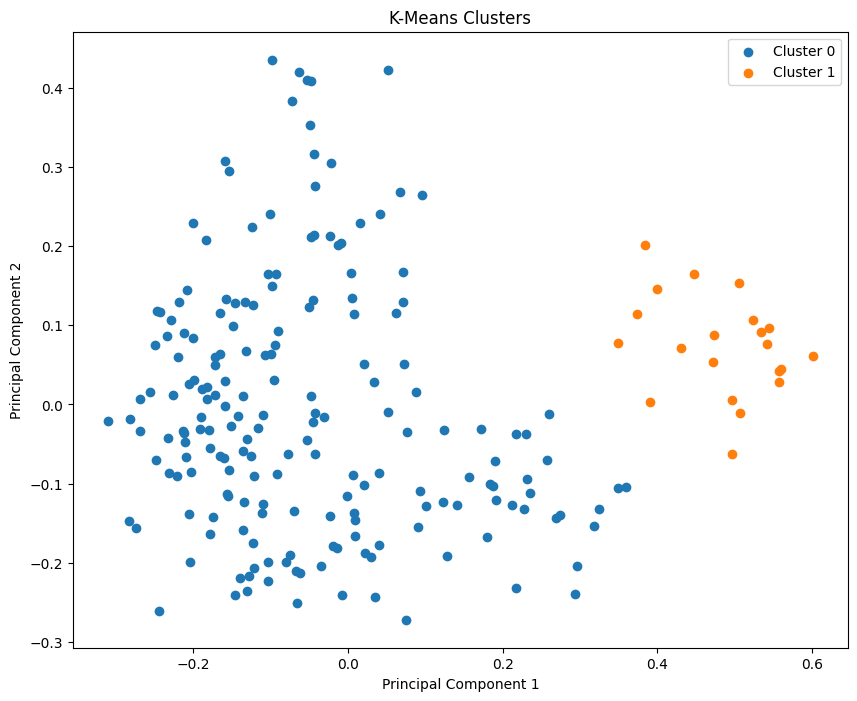

In [32]:
visualize(x, dbscan)

#### Resources
https://towardsdatascience.com/how-to-cluster-images-based-on-visual-similarity-cd6e7209fe34 \
https://towardsdatascience.com/a-one-stop-shop-for-principal-component-analysis-5582fb7e0a9c \
https://medium.com/@dnemutlu/hierarchical-clustering-of-images-with-python-f99e92855069 \
https://builtin.com/machine-learning/vgg16 \
https://www.geeksforgeeks.org/vgg-16-cnn-model/ \
https://towardsdatascience.com/how-to-use-a-pre-trained-model-vgg-for-image-classification-8dd7c4a4a517 \
https://machinelearningmastery.com/use-pre-trained-vgg-model-classify-objects-photographs/ \
https://builtin.com/machine-learning/pca-in-python \
https://medium.com/@mohitjavali/10-ways-to-extract-features-from-an-image-f44c8e9b0fbf \
https://www.geeksforgeeks.org/image-processing-with-keras-in-python/ \
https://medium.com/analytics-vidhya/importance-of-dimensionality-reduction-d6a4c7289b92 \
https://medium.com/@mygreatlearning/everything-you-need-to-know-about-vgg16-7315defb5918 \
https://medium.com/@hazallgultekin/what-is-silhouette-score-f428fb39bf9a \
https://medium.com/@aaltanim/constructing-a-clustering-model-employing-the-k-means-algorithm-546411fd9733 \
https://towardsdatascience.com/v-measure-an-homogeneous-and-complete-clustering-ab5b1823d0ad \
https://medium.com/@hazallgultekin/what-is-silhouette-score-f428fb39bf9a \
https://medium.com/@MrBam44/how-to-evaluate-the-performance-of-clustering-algorithms-3ba29cad8c03